# Task: People Detection & Counting

## Requirements

In [ ]:
!gdown "1pA7ZeXU3hh-1txS9lFQiCek1ts3MdBaj"

Downloading...
From (original): https://drive.google.com/uc?id=1pA7ZeXU3hh-1txS9lFQiCek1ts3MdBaj
From (redirected): https://drive.google.com/uc?id=1pA7ZeXU3hh-1txS9lFQiCek1ts3MdBaj&confirm=t&uuid=96861b8a-d4a2-4494-90d6-ab1abb15d5a8
To: /content/jhu_crowd_v2.0.zip
100% 3.08G/3.08G [00:18<00:00, 169MB/s]


In [ ]:
!gdown "14iLJkwj6jq0334vfO8QT1o2izZHCaEL0"

Downloading...
From (original): https://drive.google.com/uc?id=14iLJkwj6jq0334vfO8QT1o2izZHCaEL0
From (redirected): https://drive.google.com/uc?id=14iLJkwj6jq0334vfO8QT1o2izZHCaEL0&confirm=t&uuid=c7250a94-f0c2-4b04-b43e-ed2b79f832e8
To: /content/model.pt
100% 65.1M/65.1M [00:00<00:00, 181MB/s]


In [ ]:
!gdown "1UUKCqdVTqhEGqCcJKx4teIQpprOyjmdN"

Downloading...
From (original): https://drive.google.com/uc?id=1UUKCqdVTqhEGqCcJKx4teIQpprOyjmdN
From (redirected): https://drive.google.com/uc?id=1UUKCqdVTqhEGqCcJKx4teIQpprOyjmdN&confirm=t&uuid=fd3ec2fb-c2f3-45cb-9bc4-459b06a17fd2
To: /content/model1.pt
100% 65.1M/65.1M [00:00<00:00, 130MB/s]


In [ ]:
pip install livelossplot

In [ ]:
pip install pytorch_lightning

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
import random
from copy import deepcopy
from multiprocessing import Pool
from pathlib import Path
from typing import Any, Callable, Dict, List, Optional, Tuple, Union

import albumentations as albu
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pytorch_lightning as pl
import scipy
import torch
import torch.nn as nn
import torch.nn.functional as F
from livelossplot import PlotLosses
from PIL import Image
from pytorch_lightning import Callback, seed_everything
from pytorch_lightning.callbacks import ModelCheckpoint
from torch import Tensor
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import Dataset, DataLoader
from torchmetrics import MeanAbsoluteError
from torchvision import models, transforms

## Task description

The task of people counting (or crowd counting) is about estimating the number of people present in the given image. In real life this is being used in surveillance and traffic control systems.

There are several different public data sets created by researchers for experimentation and evaluation of different methods for crowd counting. In the scope of the received task JHU-CROWD++ (v2.0) data set [1] was considered for model training and performance evaluation.


## Constants

In [ ]:
!unzip "/content/jhu_crowd_v2.0.zip"

Streaming output truncated to the last 5000 lines.
  inflating: jhu_crowd_v2.0/val/images/2252.jpg  
  inflating: jhu_crowd_v2.0/val/images/0085.jpg  
  inflating: jhu_crowd_v2.0/val/images/2398.jpg  
  inflating: jhu_crowd_v2.0/val/images/3315.jpg  
  inflating: jhu_crowd_v2.0/val/images/3869.jpg  
  inflating: jhu_crowd_v2.0/val/images/2005.jpg  
  inflating: jhu_crowd_v2.0/val/images/2727.jpg  
  inflating: jhu_crowd_v2.0/val/images/2717.jpg  
  inflating: jhu_crowd_v2.0/val/images/3583.jpg  
  inflating: jhu_crowd_v2.0/val/images/1566.jpg  
  inflating: jhu_crowd_v2.0/val/images/0506.jpg  
  inflating: jhu_crowd_v2.0/val/images/0068.jpg  
  inflating: jhu_crowd_v2.0/val/images/3596.jpg  
  inflating: jhu_crowd_v2.0/val/images/0343.jpg  
  inflating: jhu_crowd_v2.0/val/images/3487.jpg  
  inflating: jhu_crowd_v2.0/val/images/0349.jpg  
  inflating: jhu_crowd_v2.0/val/images/3749.jpg  
  inflating: jhu_crowd_v2.0/val/images/1107.jpg  
  inflating: jhu_crowd_v2.0/val/images/1192.jpg  

In [ ]:
DATASET_ROOT = Path("./jhu_crowd_v2.0") # Should point to a directory containing extracted JHU-CROWD++ data set
CACHE_ROOT = Path("./cache") # Directory to cache generated density maps
MODEL_SAVE_PATH = "./model1.pt"
CHECKPOINTS_DIR = "./checkpoints"
SEED = 42

## Utility functions

Below several usefull utility functions are defined which are used throughout the notebook.

In [ ]:
def load_dataset_paths(dataset_root: Path, img_extensions: set) -> List[Tuple[Path, Path]]:
    images_path = dataset_root / "images"
    gt_path = dataset_root / "gt"

    img_paths = [p for p in images_path.iterdir() if p.suffix in img_extensions]
    gt_paths = [gt_path / f"{img_path.stem}.txt" for img_path in img_paths]
    return list(zip(img_paths, gt_paths))


def load_gt(path: Path) -> np.ndarray:
    with path.open("r") as f:
        gt = [list(map(int, line.rstrip().split())) for line in f]
    assert all([len(target) == 6 for target in gt]), f"Wrong target format {path}"
    return np.array(gt, dtype=np.int32)


def load_image(img_path: Union[Path, str]) -> Image.Image:
    return Image.open(img_path).convert("RGB")


def draw_gt_labels(img: np.ndarray, gt_labels: np.ndarray) -> None:
    img = np.array(img)
    for gt_label in gt_labels:
        keypoint = gt_label[:2]
        xy_min = keypoint - gt_label[2:4]
        xy_max = keypoint + gt_label[2:4]

        img = cv2.circle(img, tuple(keypoint), 4, (255, 0, 0), -1)
        img = cv2.rectangle(img, tuple(xy_min), tuple(xy_max), (0, 255, 0))
    return img


def gauss2D(shape: Tuple[int, int], sigma: float = 0.5) -> np.ndarray:
    my, mx = [(x - 1) / 2 for x in shape]
    y, x = np.ogrid[-my:my + 1, -mx:mx + 1]
    gmap = np.exp(-(x ** 2 + y ** 2) / (2 * sigma ** 2))
    normalizer = gmap.sum()
    if normalizer != 0:
        gmap /= normalizer
    return gmap


def generate_density_map(
    size: Tuple[int, int],
    keypoints: np.ndarray,
    kernel_size: int = 30,
    sigma: float = 8
) -> np.ndarray:
    w, h = size
    keypoints = keypoints.astype(np.int32)
    density_map = np.zeros((h, w), dtype=np.float32)

    for keypoint in keypoints:
        keypoint = np.clip(keypoint, a_min=1, a_max=[w, h])
        x1, y1 = np.clip(np.array(keypoint - kernel_size // 2), a_min=1, a_max=[w, h])
        x2, y2 = np.clip(np.array(keypoint + kernel_size // 2), a_min=1, a_max=[w, h])
        gmap = gauss2D((y2 - y1 + 1, x2 - x1 + 1), sigma)
        density_map[y1 - 1:y2, x1 - 1:x2] = density_map[y1 - 1:y2, x1 - 1:x2] + gmap

    return density_map


def random_crop(
    img: Image.Image,
    density_map: np.ndarray,
    input_h: int = 512,
    input_w: int = 512
) -> Tuple[Image.Image, np.ndarray]:
    img_w, img_h = img.size

    padded_img = np.zeros((input_h, input_w, 3), dtype=np.uint8)
    padded_density_map = np.zeros((input_h, input_w), dtype=np.float32)

    crop_min_x = np.random.randint(0, max(1, img_w - input_w))
    crop_min_y = np.random.randint(0, max(1, img_h - input_h))
    crop_max_x = min(crop_min_x + input_w, img_w)
    crop_max_y = min(crop_min_y + input_h, img_h)

    crop_w, crop_h = min(input_w, img_w), min(input_h, img_h)
    padded_img[:crop_h, :crop_w, :] = np.array(img)[crop_min_y:crop_max_y, crop_min_x:crop_max_x, :]
    padded_density_map[:crop_h, :crop_w] = density_map[crop_min_y:crop_max_y, crop_min_x:crop_max_x]

    return Image.fromarray(padded_img), padded_density_map


def resize_img(img: Image.Image, min_size: int = 512, max_size: int = 1536) -> Tuple[Image.Image, float]:
    resize_ratio = 1.0
    if img.size[0] > max_size or img.size[1] > max_size:
        resize_ratio = max_size / img.size[0] if img.size[0] > max_size else max_size / img.size[1]
        resized_w = int(np.ceil(img.size[0] * resize_ratio))
        resized_h = int(np.ceil(img.size[1] * resize_ratio))
        img = img.resize((resized_w, resized_h))

    if img.size[0] < min_size or img.size[1] < min_size:
        resize_ratio = min_size / img.size[0] if img.size[0] < min_size else min_size / img.size[1]
        resized_w = int(np.ceil(img.size[0] * resize_ratio))
        resized_h = int(np.ceil(img.size[1] * resize_ratio))
        img = img.resize((resized_w, resized_h))

    return img, resize_ratio


def scale_density_map(density_map: np.ndarray, scale_factor: int = 1):
    scaled_density_map = cv2.resize(
        density_map,
        (density_map.shape[1] // scale_factor, density_map.shape[0] // scale_factor),
        interpolation=cv2.INTER_CUBIC
    )
    scaled_density_map *= (scale_factor ** 2)
    return scaled_density_map


def preprocess_transform(
    img: Image.Image,
    mean: List[float] = [0.485, 0.456, 0.406],
    std: List[float] = [0.229, 0.224, 0.225]
) -> Tensor:
    return transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ])(img)


def seed_worker(worker_id: int) -> None:
    worker_seed = np.random.get_state()[1][0] + worker_id
    np.random.seed(worker_seed)
    random.seed(worker_seed)

## Dataset

The following class provides an easy to use interface for working with JHU-CROWD++ dataset during exploratory data analysis and model training.

In [ ]:
class JHUCrowdDataset(Dataset):
    img_extensions = {".jpg"}

    def __init__(
        self,
        dataset_root: Path,
        subset_name: str = "train",
        transform: Optional[Callable[[Image.Image, np.ndarray], Tuple[Tensor, np.ndarray]]] = None,
        scale_factor: int = 1,
        min_size: Optional[int] = None,
        max_size: Optional[int] = None,
        min_crowd_size: int = 0,
        force_pregenerate: bool = False,
        num_workers: int = 8,
        cache_root: Path = Path("./cache"),
        cache: bool = True
    ) -> None:
        super(JHUCrowdDataset, self).__init__()

        self.dataset_root = dataset_root
        self.subset_name = subset_name
        self.transform = transform
        self.scale_factor = scale_factor
        self.min_size = min_size
        self.max_size = max_size
        self.min_crowd_size = min_crowd_size
        self.num_workers = num_workers
        self.cache_dir = cache_root / subset_name
        self.cache = cache

        img_labels_df = self.load_img_labels(dataset_root / subset_name)
        self.img_labels_df = img_labels_df[img_labels_df["count"] >= min_crowd_size]

        if force_pregenerate and cache:
            self.pregenerate_density_maps()

    def load_img_labels(self, dataset_root: Path) -> pd.DataFrame:
        # Load image_labels.txt
        img_info_df = pd.read_csv(
            dataset_root / "image_labels.txt",
            names=["name", "count", "scene_type", "weather_condition", "distractor"],
            dtype={"name": str, "count": int, "scene_type": str, "weather_condition": int, "distractor": int}
        )
        img_info_df.set_index("name", inplace=True)

        # Load image & gt path combinations"
        img_gt_paths = load_dataset_paths(dataset_root, self.img_extensions)
        names = [img_path.stem for img_path, _ in img_gt_paths]

        img_gt_paths_df = pd.DataFrame(img_gt_paths, columns=["img_path", "gt_path"], index=names)
        gt_labels = pd.Series([
            load_gt(gt_path) for gt_path in img_gt_paths_df["gt_path"]], name="gt_labels", index=names)
        gt_counts = pd.Series([len(gt) for gt in gt_labels], index=names)

        # Check integrity
        assert len(img_info_df) == len(img_gt_paths)
        assert len(img_gt_paths_df.index.difference(img_info_df.index)) == 0
        assert all(img_info_df["count"].eq(gt_counts))

        return pd.concat([img_gt_paths_df, gt_labels, img_info_df], axis=1)

    def pregenerate_density_maps(self) -> None:
        with Pool(self.num_workers) as p:
            p.map(self.__getitem__, range(len(self)))

    def __getitem__(self, index: int) -> Tuple[Image.Image, np.ndarray]:
        sample = self.img_labels_df.iloc[index]

        cached_img_path = self.cache_dir / f"{sample.name}.jpg"
        cached_density_path = self.cache_dir / f"{sample.name}.npy"
        if self.cache and cached_density_path.exists() and cached_img_path.exists():
            img = load_image(cached_img_path)
            density_map = np.load(str(cached_density_path))
        else:
            img = load_image(sample["img_path"])
            keypoints = np.empty((0, 2))
            if len(sample["gt_labels"] > 0):
                keypoints = sample["gt_labels"][:, :2]

            if self.min_size is not None and self.max_size is not None:
                img, resize_ratio = resize_img(img, min_size=self.min_size, max_size=self.max_size)
                keypoints = (keypoints * resize_ratio).astype(np.int32)
            density_map = generate_density_map(img.size, keypoints)

            if self.cache:
                self.cache_dir.mkdir(parents=True, exist_ok=True)
                np.save(str(self.cache_dir / f"{sample.name}.npy"), density_map)
                img.save(str(self.cache_dir / f"{sample.name}.jpg"))

        if self.transform is not None:
            img, density_map = self.transform(img, density_map)

        density_map = scale_density_map(density_map, self.scale_factor)

        return img, density_map

    def __len__(self) -> int:
        return len(self.img_labels_df)

    @staticmethod
    def collate_fn(samples: List[Tuple[Tensor, Tensor]]) -> List[Tensor]:
        img_batch = torch.stack([sample[0] for sample in samples], 0)
        density_map_batch = torch.stack([torch.from_numpy(sample[1]).unsqueeze(0) for sample in samples], 0)
        return [img_batch, density_map_batch]

## Exploratory data analysis

As the task asks to take high density images (>=50 people in the picture) from the data set to train and test a model, I filter out images having <50 people in them before performing explotatory data analysis. But by setting min_crowd_size argument to 0, all pictured can be considered in below analysis.

In [ ]:
train_dataset = JHUCrowdDataset(dataset_root=DATASET_ROOT, subset_name="train", min_crowd_size=50)
valid_dataset = JHUCrowdDataset(dataset_root=DATASET_ROOT, subset_name="val", min_crowd_size=50)
test_dataset = JHUCrowdDataset(dataset_root=DATASET_ROOT, subset_name="test", min_crowd_size=50)

all_img_labels_df = pd.concat([
    train_dataset.img_labels_df,
    valid_dataset.img_labels_df,
    test_dataset.img_labels_df
])

In [ ]:
print("Train data set size:", len(train_dataset))
print("Valid data set size:", len(valid_dataset))
print("Test data set size:", len(test_dataset))
print("Total size:", len(all_img_labels_df))

Train data set size: 1636
Valid data set size: 337
Test data set size: 1171
Total size: 3144


CrowdDataset creates a Pandas DataFrame, which contains all information present in JHU-CROWD++ dataset.

In [ ]:
train_dataset.img_labels_df.head()

,img_path,gt_path,gt_labels,count,scene_type,weather_condition,distractor
3386,jhu_crowd_v2.0/train/images/3386.jpg,jhu_crowd_v2.0/train/gt/3386.txt,"[[1052, 663, 18, 21, 1, 0], [924, 717, 18, 21,...",1456,rally,0,0
4018,jhu_crowd_v2.0/train/images/4018.jpg,jhu_crowd_v2.0/train/gt/4018.txt,"[[2732, 551, 37, 58, 1, 1], [3773, 1789, 493, ...",114,street,0,0
2221,jhu_crowd_v2.0/train/images/2221.jpg,jhu_crowd_v2.0/train/gt/2221.txt,"[[295, 398, 23, 21, 1, 0], [213, 303, 17, 13, ...",318,protest,0,0
2184,jhu_crowd_v2.0/train/images/2184.jpg,jhu_crowd_v2.0/train/gt/2184.txt,"[[295, 141, 23, 26, 1, 0], [418, 124, 17, 20, ...",113,gathering,0,0
3046,jhu_crowd_v2.0/train/images/3046.jpg,jhu_crowd_v2.0/train/gt/3046.txt,"[[674, 11, 11, 13, 1, 0], [76, 60, 7, 7, 1, 0]...",679,protest,0,0


#### Example pictures and annotations

Below you can see some example images and corresponding labels from training set.

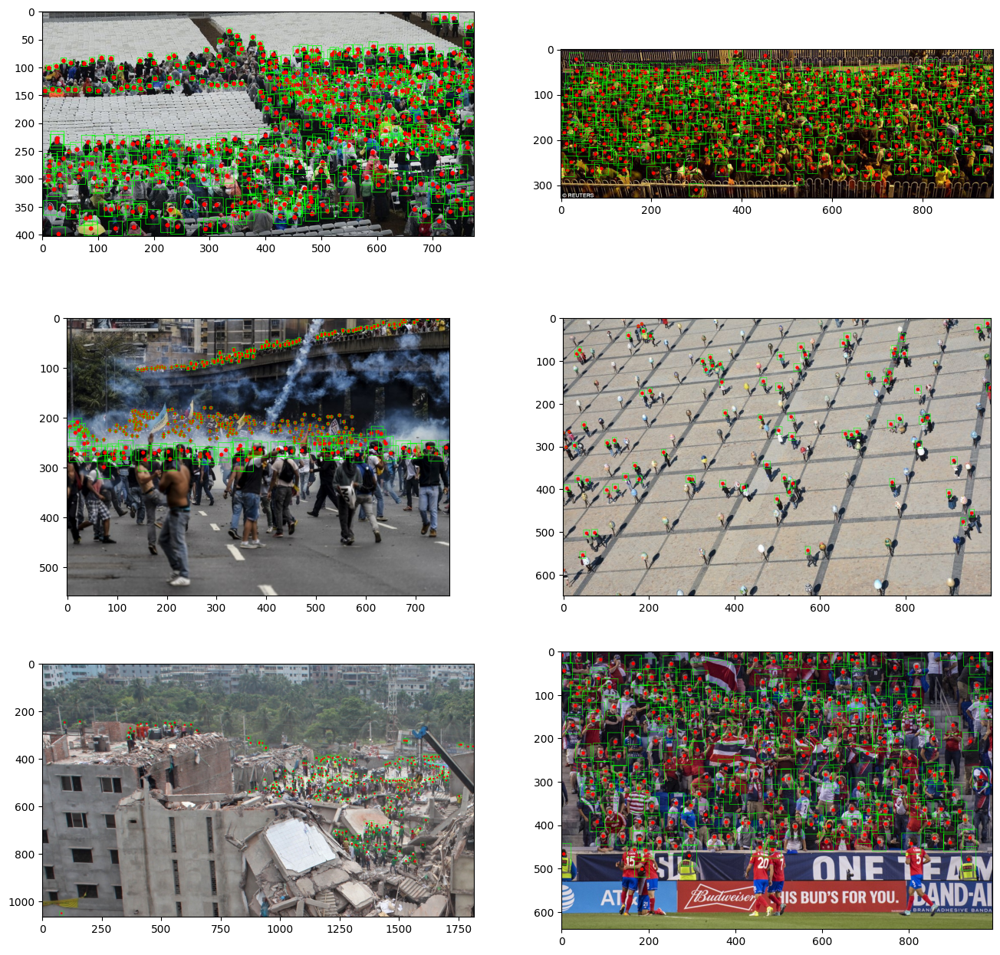

In [ ]:
random_indices = np.random.choice(train_dataset.img_labels_df.index, 6)

fig, ax = plt.subplots(3, 2, figsize=(16, 16))

for i, index in enumerate(random_indices):
    sample = train_dataset.img_labels_df.loc[index]
    img = load_image(sample["img_path"])
    gt_labels = sample["gt_labels"]
    ax[i // 2, i % 2].imshow(draw_gt_labels(img, gt_labels))

## Density map generation

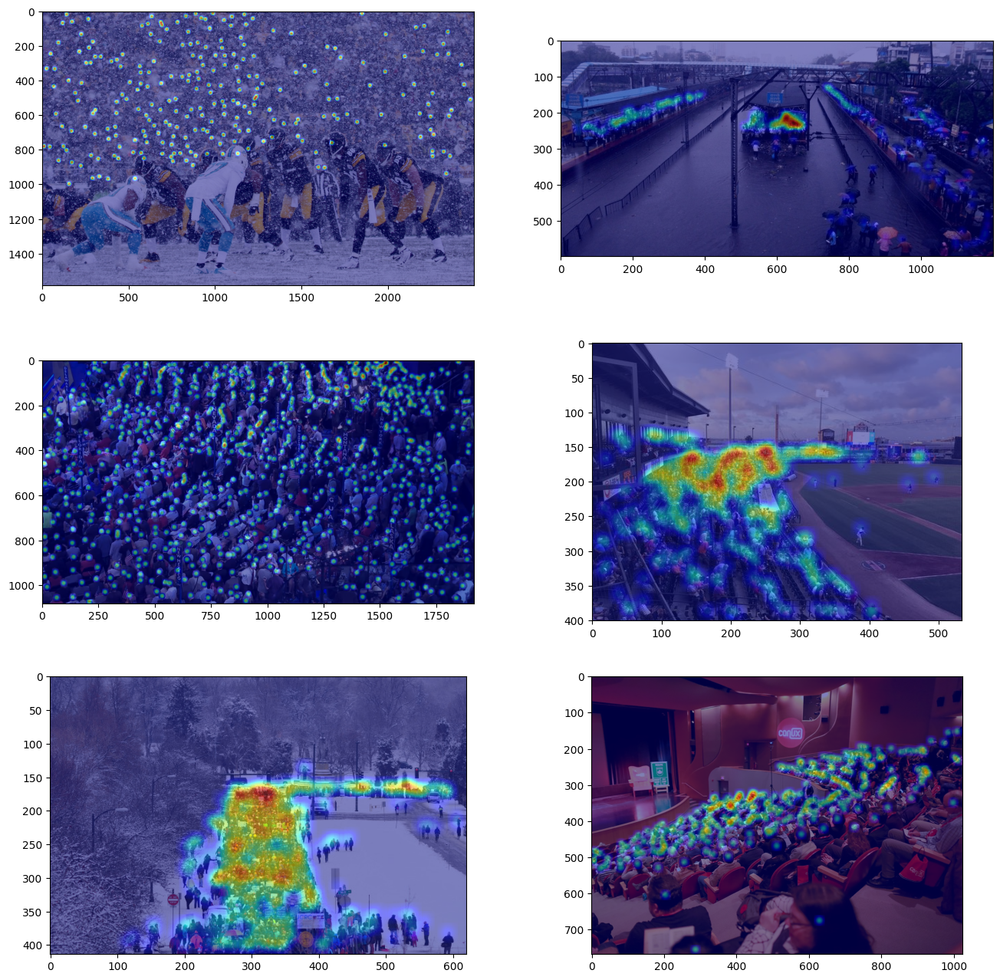

In [ ]:
random_indices = np.random.randint(0, len(train_dataset), 6)

fig, ax = plt.subplots(3, 2, figsize=(16, 16))

for i, index in enumerate(random_indices):
    img, density_map = train_dataset[index]
    ax[i // 2, i % 2].imshow(img)
    ax[i // 2, i % 2].imshow(density_map, cmap="jet", alpha=0.5)

## Transforms

In [ ]:
def get_train_transform(
    input_h: int = 512,
    input_w: int = 512
) -> Callable[[Image.Image, np.ndarray], Tuple[Tensor, np.ndarray]]:
    def transform(
        img: Image.Image,
        density_map: np.ndarray,
    ) -> Tuple[Tensor, np.ndarray]:
        cropped_img, cropped_density_map = random_crop(img, density_map, input_h=input_h, input_w=input_w)

        aug_result = albu.Compose([
            albu.RandomBrightnessContrast(p=0.4),
            albu.ISONoise(p=0.25),
            albu.HorizontalFlip(p=0.5)
        ])(image=np.array(cropped_img), mask=cropped_density_map)

        cropped_img = Image.fromarray(aug_result["image"])
        cropped_density_map = aug_result["mask"]

        cropped_img = preprocess_transform(cropped_img)

        return cropped_img, cropped_density_map

    return transform



def test_transform(img: Image.Image, density_map: np.ndarray) -> Tuple[Tensor, np.ndarray]:
    img = preprocess_transform(img)
    return img, density_map

## Datamodule

In [ ]:
class CrowdDataModule(pl.LightningDataModule):

    def __init__(
        self,
        dataset_root: Path,
        batch_size: int = 8,
        num_workers: int = 8,
        input_size: int = 512,
        min_crowd_size: int = 50,
        density_scale_factor: int = 8,
    ) -> None:
        super().__init__()

        self.dataset_root = dataset_root
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.input_size = input_size
        self.min_crowd_size = min_crowd_size
        self.density_scale_factor = density_scale_factor

    def transfer_batch_to_device(self, batch: Any, device: torch.device, dataloader_idx) -> Any:
        batch[0] = batch[0].to(device)
        batch[1] = batch[1].to(device)
        return batch

    def train_dataloader(self) -> DataLoader:
        dataset = JHUCrowdDataset(
            dataset_root=self.dataset_root,
            subset_name="train",
            min_size=512,
            max_size=1536,
            transform=get_train_transform(input_w=self.input_size, input_h=self.input_size),
            min_crowd_size=self.min_crowd_size,
            scale_factor=self.density_scale_factor
        )

        return DataLoader(
            dataset,
            batch_size=self.batch_size,
            num_workers=self.num_workers,
            collate_fn=JHUCrowdDataset.collate_fn,
            drop_last=True,
            shuffle=True,
            worker_init_fn=seed_worker
        )

    def val_dataloader(self) -> DataLoader:
        dataset = JHUCrowdDataset(
            dataset_root=self.dataset_root,
            subset_name="val",
            min_size=512,
            max_size=1536,
            transform=test_transform,
            min_crowd_size=self.min_crowd_size,
            scale_factor=self.density_scale_factor
        )

        return DataLoader(
            dataset,
            batch_size=1,
            num_workers=self.num_workers,
            collate_fn=JHUCrowdDataset.collate_fn
        )

    def test_dataloader(self) -> DataLoader:
        dataset = JHUCrowdDataset(
            dataset_root=self.dataset_root,
            subset_name="test",
            min_size=512,
            max_size=1536,
            transform=test_transform,
            min_crowd_size=self.min_crowd_size,
            scale_factor=self.density_scale_factor
        )

        return DataLoader(
            dataset,
            batch_size=1,
            num_workers=self.num_workers,
            collate_fn=JHUCrowdDataset.collate_fn
        )

## Model

For the purposes of solving the task a CNN model called CSRNet [2] was considered. In the scope of this task the choice was mainly made due to time constraints for finishing the task. This is a relatively simple model, which, nonetheless, performs good. Its main limitation is that it's hard for this model to learn large scale variations present in high density crowd pictures. There are current state of the art models, like SASNet [3], which try to address this problem. I have read this paper and started coding it up, though I didn't manage to finish it during the short amount of time that I had.

In [ ]:
class CSRNet(nn.Module):
    def __init__(self) -> None:
        super(CSRNet, self).__init__()

        backbone = models.vgg16(pretrained=True)
        self.frontend = nn.Sequential(*list(backbone.features.children())[:22])  # size=(N, 512, x.H/8, x.W/8)
        self.backend = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=(3, 3), padding=2, dilation=(2, 2)),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=(3, 3), padding=2, dilation=(2, 2)),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=(3, 3), padding=2, dilation=(2, 2)),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 256, kernel_size=(3, 3), padding=2, dilation=(2, 2)),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 128, kernel_size=(3, 3), padding=2, dilation=(2, 2)),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 64, kernel_size=(3, 3), padding=2, dilation=(2, 2)),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 1, kernel_size=(1, 1))
        )

        for m in self.backend.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.normal_(m.weight, std=0.01)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

    def forward(self, x: Tensor) -> Tensor:
        x = self.frontend(x)
        x = self.backend(x)
        return x

In [ ]:
checkpoint = torch.load("/content/model.pt")
print(checkpoint)

CSRNet(
  (frontend): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilatio

## Trainer

In [ ]:
class LitCrowdNet(pl.LightningModule):

    def __init__(self) -> None:
        super().__init__()
        # for the first Run
        self.model = CSRNet()
        #for the next runs
        self.model = torch.load("/content/model1.pt")
        self.valid_mae = MeanAbsoluteError()
        self.test_mae = MeanAbsoluteError()

    def loss(self, pred_dens_map: Tensor, gt_dens_map: Tensor) -> Tensor:
        return F.mse_loss(pred_dens_map, gt_dens_map, reduction="sum") / (torch.sum(gt_dens_map) + 1)

    def forward(self, images: Tensor) -> Tensor:
        return self.model(images)

    def configure_optimizers(self) -> Dict[str, Any]:
        optimizer = torch.optim.AdamW(self.model.parameters(), 5e-6)

        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": StepLR(optimizer, step_size=5, gamma=0.5)
            },
        }

    def training_step(self, batch: List[Tensor], batch_idx: int) -> Tensor:
        output = self.forward(batch[0])
        loss = self.loss(output, batch[1])
        self.log("train_loss", loss.item(), on_step=False, on_epoch=True)
        return loss

    def validation_step(self, batch: List[Tensor], batch_idx: int) -> None:
        output = self.forward(batch[0])
        loss = self.loss(output, batch[1])

        gt_counts = torch.sum(batch[1].detach().squeeze(1), dim=[1, 2])
        pred_counts = torch.sum(torch.clip(output.detach().squeeze(1), min=0), dim=[1, 2])

        self.valid_mae(pred_counts, gt_counts)

        self.log("valid_loss", loss.item(), on_step=False, on_epoch=True)
        self.log("valid_mae", self.valid_mae, on_step=False, on_epoch=True)

    def test_step(self, batch: List[Tensor], batch_idx: int) -> None:
        output = self.forward(batch[0])
        loss = self.loss(output, batch[1])

        gt_counts = torch.sum(batch[1].detach().squeeze(1), dim=[1, 2])
        pred_counts = torch.sum(torch.clip(output.detach().squeeze(1), min=0), dim=[1, 2])

        self.test_mae(pred_counts, gt_counts)

        self.log("test_loss", loss.item(),  on_step=False, on_epoch=True)
        self.log("test_mae", self.test_mae, on_step=False, on_epoch=True)

## Train the model

In [ ]:
class MetricsCallback(Callback):
    def __init__(self):
        super().__init__()
        self.liveloss = PlotLosses()

    def on_epoch_end(self, trainer, pl_module):
        metrics = deepcopy(trainer.callback_metrics)
        updates = {}
        for name, value in metrics.items():
            updates[name] = value.cpu().numpy()
        self.liveloss.update(updates, pl_module.current_epoch)
        self.liveloss.send()

In [ ]:
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
from pytorch_lightning.loggers import CSVLogger

In [ ]:
seed_everything(SEED)
dm = CrowdDataModule(DATASET_ROOT)
lit_model = LitCrowdNet()
checkpoint_callback = ModelCheckpoint(
    dirpath=CHECKPOINTS_DIR,
    filename="crowdnet-{epoch:02d}-{valid_mae:.2f}",
    monitor="valid_mae",
    mode="min",
    verbose=True,
    save_top_k=5
)
trainer = pl.Trainer(
    # gpus=[0],
    fast_dev_run=False,
    max_epochs=20,
    # checkpoint_callback=True,
    callbacks=[checkpoint_callback, MetricsCallback()],
    deterministic=True,
    # progress_bar_refresh_rate=0,
    num_sanity_val_steps=0
)

INFO:lightning_fabric.utilities.seed:Seed set to 42
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 169MB/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 

In [ ]:
trainer.fit(lit_model, datamodule=dm)

INFO:lightning_fabric.utilities.seed:Seed set to 42
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:04<00:00, 133MB/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 

Training: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 204: 'valid_mae' reached 176.40282 (best 176.40282), saving model to '/content/checkpoints/crowdnet-epoch=00-valid_mae=176.40.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 408: 'valid_mae' reached 224.10156 (best 176.40282), saving model to '/content/checkpoints/crowdnet-epoch=01-valid_mae=224.10.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 612: 'valid_mae' reached 264.86951 (best 176.40282), saving model to '/content/checkpoints/crowdnet-epoch=02-valid_mae=264.87.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 816: 'valid_mae' reached 227.09537 (best 176.40282), saving model to '/content/checkpoints/crowdnet-epoch=03-valid_mae=227.10.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 1020: 'valid_mae' reached 137.35529 (best 137.35529), saving model to '/content/checkpoints/crowdnet-epoch=04-valid_mae=137.36.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 1224: 'valid_mae' reached 164.88731 (best 137.35529), saving model to '/content/checkpoints/crowdnet-epoch=05-valid_mae=164.89.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 1428: 'valid_mae' reached 135.72415 (best 135.72415), saving model to '/content/checkpoints/crowdnet-epoch=06-valid_mae=135.72.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 1632: 'valid_mae' reached 129.29759 (best 129.29759), saving model to '/content/checkpoints/crowdnet-epoch=07-valid_mae=129.30.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 1836: 'valid_mae' reached 119.80288 (best 119.80288), saving model to '/content/checkpoints/crowdnet-epoch=08-valid_mae=119.80.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 2040: 'valid_mae' reached 127.06596 (best 119.80288), saving model to '/content/checkpoints/crowdnet-epoch=09-valid_mae=127.07.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 2244: 'valid_mae' reached 124.29279 (best 119.80288), saving model to '/content/checkpoints/crowdnet-epoch=10-valid_mae=124.29.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 2448: 'valid_mae' reached 124.72822 (best 119.80288), saving model to '/content/checkpoints/crowdnet-epoch=11-valid_mae=124.73.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 2652: 'valid_mae' reached 120.61203 (best 119.80288), saving model to '/content/checkpoints/crowdnet-epoch=12-valid_mae=120.61.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 2856: 'valid_mae' reached 121.51154 (best 119.80288), saving model to '/content/checkpoints/crowdnet-epoch=13-valid_mae=121.51.ckpt' as top 5
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-9-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 14, global step 3060: 'valid_mae' reached 123.43047 (best 119.80288), saving model to '/content/checkpoints/crowdnet-epoch=14-valid_mae=123.43.ckpt' as top 5
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.


In [ ]:
trainer.fit(lit_model, datamodule=dm)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type              | Params | Mode 
--------------------------------------------------------
0 | model     | CSRNet            | 16.3 M | train
1 | valid_mae | MeanAbsoluteError | 0      | train
2 | test_mae  | MeanAbsoluteError | 0      | train
--------------------------------------------------------
16.3 M    Trainable params
0         Non-trainable params
16.3 M    Total params
65.054    Total estimated model params size (MB)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/free

Training: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 204: 'valid_mae' reached 127.37237 (best 127.37237), saving model to '/content/checkpoints/crowdnet-epoch=00-valid_mae=127.37.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 408: 'valid_mae' reached 125.90540 (best 125.90540), saving model to '/content/checkpoints/crowdnet-epoch=01-valid_mae=125.91.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 612: 'valid_mae' reached 142.92874 (best 125.90540), saving model to '/content/checkpoints/crowdnet-epoch=02-valid_mae=142.93.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 816: 'valid_mae' reached 174.86893 (best 125.90540), saving model to '/content/checkpoints/crowdnet-epoch=03-valid_mae=174.87.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 1020: 'valid_mae' reached 154.66129 (best 125.90540), saving model to '/content/checkpoints/crowdnet-epoch=04-valid_mae=154.66.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 1224: 'valid_mae' reached 121.10922 (best 121.10922), saving model to '/content/checkpoints/crowdnet-epoch=05-valid_mae=121.11.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 1428: 'valid_mae' reached 137.49649 (best 121.10922), saving model to '/content/checkpoints/crowdnet-epoch=06-valid_mae=137.50.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 1632: 'valid_mae' was not in top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Pytho

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 1836: 'valid_mae' reached 125.38641 (best 121.10922), saving model to '/content/checkpoints/crowdnet-epoch=08-valid_mae=125.39.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 2040: 'valid_mae' reached 121.29440 (best 121.10922), saving model to '/content/checkpoints/crowdnet-epoch=09-valid_mae=121.29.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 2244: 'valid_mae' reached 112.84535 (best 112.84535), saving model to '/content/checkpoints/crowdnet-epoch=10-valid_mae=112.85.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 2448: 'valid_mae' was not in top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Pyth

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 2652: 'valid_mae' reached 116.17321 (best 112.84535), saving model to '/content/checkpoints/crowdnet-epoch=12-valid_mae=116.17.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 2856: 'valid_mae' reached 124.86346 (best 112.84535), saving model to '/content/checkpoints/crowdnet-epoch=13-valid_mae=124.86.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 14, global step 3060: 'valid_mae' was not in top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Pyth

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 15, global step 3264: 'valid_mae' reached 119.70444 (best 112.84535), saving model to '/content/checkpoints/crowdnet-epoch=15-valid_mae=119.70.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 16, global step 3468: 'valid_mae' reached 112.38219 (best 112.38219), saving model to '/content/checkpoints/crowdnet-epoch=16-valid_mae=112.38.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 17, global step 3672: 'valid_mae' reached 116.53933 (best 112.38219), saving model to '/content/checkpoints/crowdnet-epoch=17-valid_mae=116.54.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 18, global step 3876: 'valid_mae' reached 114.99905 (best 112.38219), saving model to '/content/checkpoints/crowdnet-epoch=18-valid_mae=115.00.ckpt' as top 5
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed)
<ipython-input-8-a8cf78c68bc5>:127: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(worker_seed

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 19, global step 4080: 'valid_mae' was not in top 5
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Loss over time is looking strange in above plots, but according to MAE metric, model learned usefull weights over time.

## Test the model

In [ ]:
trainer = pl.Trainer()
trainer.test(lit_model, datamodule=dm)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to 

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    0.1379408985376358     │
│         test_mae          │    109.59978485107422     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.1379408985376358, 'test_mae': 109.59978485107422}]

In [ ]:
trainer = pl.Trainer()
trainer.test(lit_model, datamodule=dm)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to 

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    0.1448541283607483     │
│         test_mae          │    124.37141418457031     │
└───────────────────────────┴───────────────────────────┘

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[{'test_loss': 0.1448541283607483, 'test_mae': 124.37141418457031}]

## Save the model

In [ ]:
torch.save(lit_model.model, MODEL_SAVE_PATH)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
# copy it there

Mounted at /content/drive


In [ ]:
!cp model1.pt /content/drive/MyDrive

## Some qualitative results

In [ ]:
def count_from_density_map(density_map: np.ndarray) -> int:
    return round(np.sum(np.clip(density_map, a_min=0, a_max=None)))

In [ ]:
def predict_density_map(img: Image.Image, model: nn.Module) -> np.ndarray:
    img, resize_ratio = resize_img(img)
    img_input = preprocess_transform(img).unsqueeze(dim=0)
    density_map = model(img_input).detach().cpu().numpy()[0][0]
    return density_map

# first try

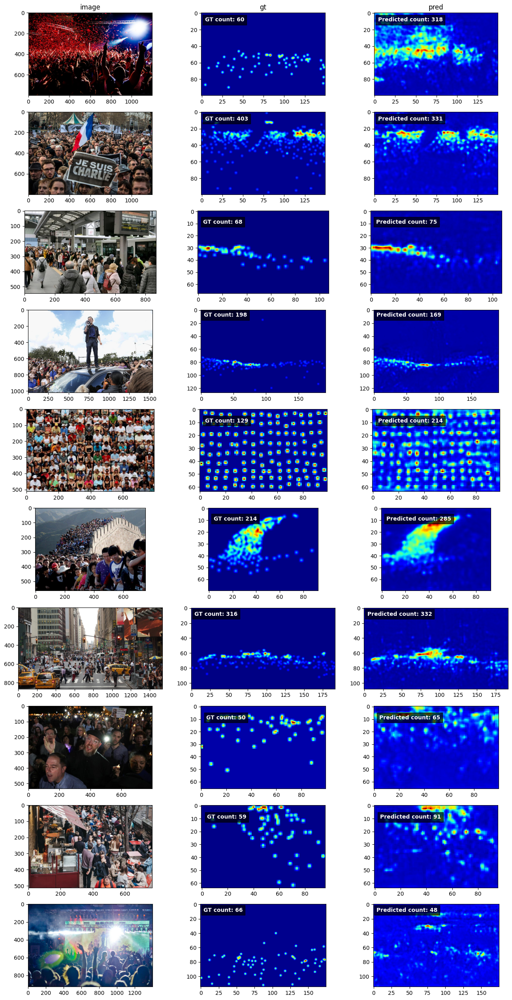

In [ ]:
random_indices = np.random.randint(0, len(test_dataset), 10)

fig, axes = plt.subplots(10, 3, figsize=(16, 32))

column_names = ["image", "gt", "pred"]
for ax, col in zip(axes[0], column_names):
    ax.set_title(col)

for i, index in enumerate(random_indices):
    img, density_map = train_dataset[index]

    gt_count = count_from_density_map(density_map)
    density_map = scale_density_map(density_map, 8)

    pred_density_map = predict_density_map(img, lit_model)
    pred_count = count_from_density_map(pred_density_map)

    axes[i, 0].imshow(img)
    axes[i, 1].imshow(density_map, cmap="jet")
    axes[i, 2].imshow(pred_density_map, cmap="jet")

    axes[i, 1].text(
        x=4,
        y=10,
        s=f"GT count: {gt_count}",
        bbox={"facecolor": "black", "alpha": 0.7, "pad": 4},
        c="white",
        weight="bold"
    )

    axes[i, 2].text(
        x=4,
        y=10,
        s=f"Predicted count: {pred_count}",
        bbox={"facecolor": "black", "alpha": 0.7, "pad": 4},
        c="white",
        weight="bold"
    )

# second try

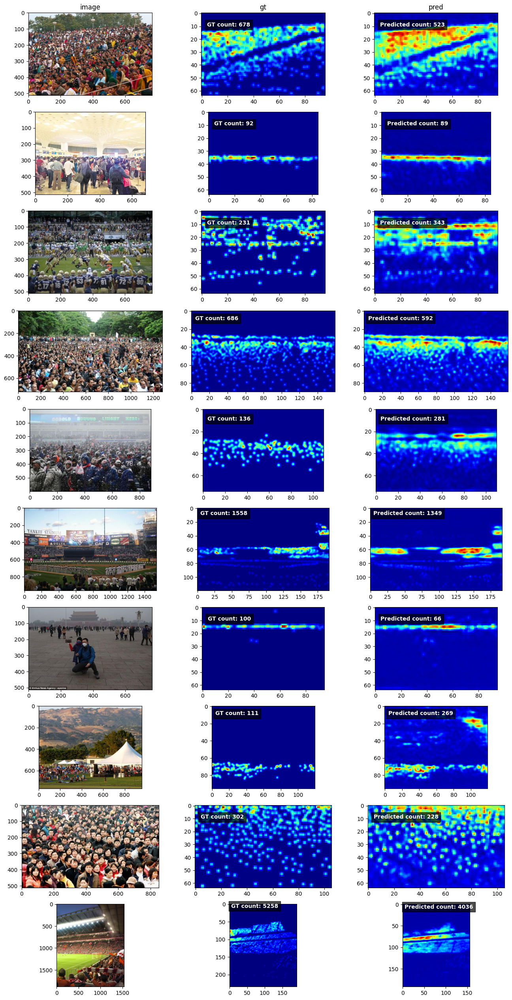

In [ ]:
random_indices = np.random.randint(0, len(test_dataset), 10)

fig, axes = plt.subplots(10, 3, figsize=(16, 32))

column_names = ["image", "gt", "pred"]
for ax, col in zip(axes[0], column_names):
    ax.set_title(col)

for i, index in enumerate(random_indices):
    img, density_map = train_dataset[index]

    gt_count = count_from_density_map(density_map)
    density_map = scale_density_map(density_map, 8)

    pred_density_map = predict_density_map(img, lit_model)
    pred_count = count_from_density_map(pred_density_map)

    axes[i, 0].imshow(img)
    axes[i, 1].imshow(density_map, cmap="jet")
    axes[i, 2].imshow(pred_density_map, cmap="jet")

    axes[i, 1].text(
        x=4,
        y=10,
        s=f"GT count: {gt_count}",
        bbox={"facecolor": "black", "alpha": 0.7, "pad": 4},
        c="white",
        weight="bold"
    )

    axes[i, 2].text(
        x=4,
        y=10,
        s=f"Predicted count: {pred_count}",
        bbox={"facecolor": "black", "alpha": 0.7, "pad": 4},
        c="white",
        weight="bold"
    )

In [ ]:
!gdown "1I3lPiyuegFU8b8LiYYjTa45dBjzVmAzJ"

Downloading...
From: https://drive.google.com/uc?id=1I3lPiyuegFU8b8LiYYjTa45dBjzVmAzJ
To: /content/2.mp4
100% 12.2M/12.2M [00:00<00:00, 77.1MB/s]


In [ ]:
!gdown "1OYobXpsLTkwh3WqNa22OMQ73C53IsX05"

Downloading...
From: https://drive.google.com/uc?id=1OYobXpsLTkwh3WqNa22OMQ73C53IsX05
To: /content/4.mp4
100% 31.1M/31.1M [00:00<00:00, 35.1MB/s]


In [ ]:
def annotate_frame(frame, pred_density_map, pred_count):
    # Resize pred_density_map to match frame size
    pred_density_map_resized = cv2.resize(pred_density_map, (frame.shape[1], frame.shape[0]))

    # Apply color map to the resized pred_density_map
    pred_density_map_colored = cv2.applyColorMap(cv2.normalize(pred_density_map_resized, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8), cv2.COLORMAP_JET)

    frame_height, frame_width, _ = frame.shape
    combined_frame = np.zeros((frame_height, frame_width * 2, 3), dtype=np.uint8)

    combined_frame[:, :frame_width, :] = frame
    combined_frame[:, frame_width:, :] = cv2.cvtColor(pred_density_map_colored, cv2.COLOR_BGR2RGB)

    cv2.putText(combined_frame, f"Predicted count: {pred_count}", (frame_width + 10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

    return combined_frame

def process_video(video_path: str, output_path: str, model: nn.Module):
    # Move model to GPU and set to evaluation mode
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    model.eval()

    cap = cv2.VideoCapture(video_path)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)

    out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width * 2, frame_height))

    preprocess = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((frame_height, frame_width))  # Resize as needed
    ])

    for i in range(frame_count):
        ret, frame = cap.read()
        if not ret:
            break
        img = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

        # Preprocess the frame and move it to GPU
        img_tensor = preprocess(img).unsqueeze(0).to(device)

        with torch.no_grad():
            pred_density_map = model(img_tensor).cpu().numpy().squeeze()  # Assuming the model's output is the density map

        pred_count = pred_density_map.sum()  # Example of counting from density map

        annotated_frame = annotate_frame(frame, pred_density_map, pred_count)
        out.write(cv2.cvtColor(annotated_frame, cv2.COLOR_RGB2BGR))

    cap.release()
    out.release()

# Usage example
video_path = '4.mp4'
output_path = 'output4.mp4'
model = torch.load("model1.pt")  # Assuming lit_model is your pre-trained model
process_video(video_path, output_path, model)


## References

[1] Sindagi, V.A., Yasarla, R., & Patel, V.M. (2020). JHU-CROWD++: Large-Scale Crowd Counting Dataset and A Benchmark Method. IEEE transactions on pattern analysis and machine intelligence, PP.

[2] Li, Y., Zhang, X., & Chen, D. (2018). CSRNet: Dilated Convolutional Neural Networks for Understanding the Highly Congested Scenes. 2018 IEEE/CVF Conference on Computer Vision and Pattern Recognition, 1091-1100.
